# Texture-Based Optical Guided Despeckling of SAR Image

In [1]:
import os
# os.environ['JAX_PLATFORM_NAME'] = 'cpu'

import jax
import jax.numpy as jnp
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from scripts.io import read_image, save_image, KEY_INPUT_EO, KEY_INPUT_SAR, KEY_OUTPUT_SAR
from scripts.utils import T
from scripts.texture_descriptor import rgb2gray, rgb2lab, compute_texture_descriptor, compute_descriptor_variance, gaussian_kernel_1d
from scripts.mubf import MUBF
from scripts.despeckle import despeckle

print("Default backend:", jax.default_backend())
print("Devices:", jax.devices())

INFO:jax._src.xla_bridge:Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
INFO:jax._src.xla_bridge:Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


Default backend: gpu
Devices: [cuda(id=0)]


### Load Data

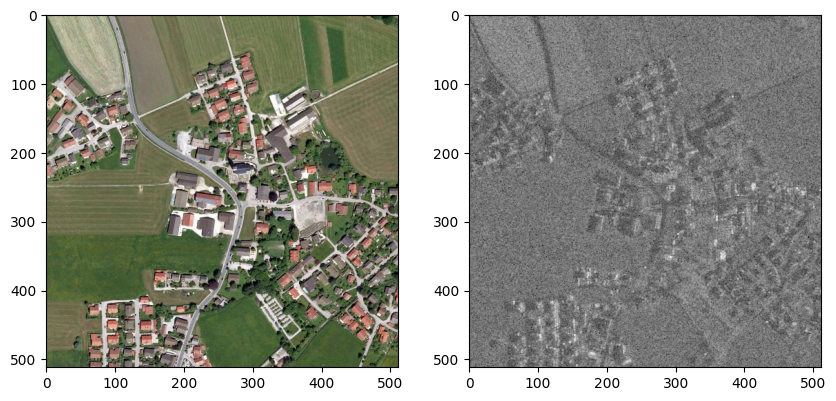

In [2]:
input_path = "../../dataset/data_village.npz"

sar = read_image(input_path, key=KEY_INPUT_SAR).squeeze()
eo = read_image(input_path, key=KEY_INPUT_EO)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(eo)
plt.subplot(1, 2, 2)
plt.imshow(T(sar), cmap='gray')

In [3]:
input_eo_rgb = (jnp.array(eo.copy()) / 255.0)
input_sar = T(sar.copy())

input_eo_gray = rgb2gray(input_eo_rgb)
input_eo_lab = rgb2lab(input_eo_rgb)

# Cast
input_eo_rgb = input_eo_rgb.astype(jnp.float32)
input_eo_gray = input_eo_gray.astype(jnp.float32)
input_eo_lab = input_eo_lab.astype(jnp.float32)
input_sar = input_sar.astype(jnp.float32)

print(sar.shape, input_eo_gray.shape, input_eo_lab.shape, input_eo_rgb.shape)

(512, 512) (512, 512, 1) (512, 512, 3) (512, 512, 3)


### Compute Texture Descriptor

In [4]:
params_texture_descriptor = {
    'img': input_eo_lab,
    'radius': 7,
}

S = compute_texture_descriptor(**params_texture_descriptor)
if jnp.isnan(S).any():
    S = jnp.nan_to_num(S, nan=0.0)

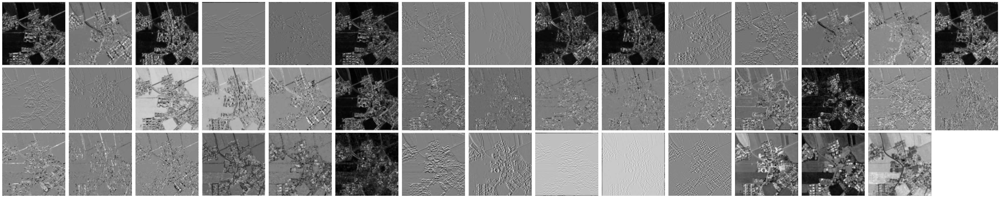

In [5]:
D = S.shape[-1]

N = 15  # Number of columns for plotting
plt.figure(figsize=(N * 3, (D // N + 1) * 3))
for i in range(D):
    plt.subplot(D // N + 1, N, i + 1)
    plt.imshow(S[:,:,i], cmap='gray')
    plt.axis('off')
plt.tight_layout()

### MUBF

In [6]:
params_mubf = {
    'target': S,
    'guides': [input_eo_gray, input_sar[..., None]],  # (H, W, 1)
    'sigma_spatial': 5,
    'sigma_guides': [0.001, 0.01],
    'gamma_guides': [1.0, 1.0],
    'alpha': 5,
    'n_iterations': 100,
    'n_blocks': 10,
}

mubf = MUBF()
S_mubf, errors = mubf.filter(**params_mubf)

Iterations: 100%|██████████| 100/100 [02:51<00:00,  1.72s/it]


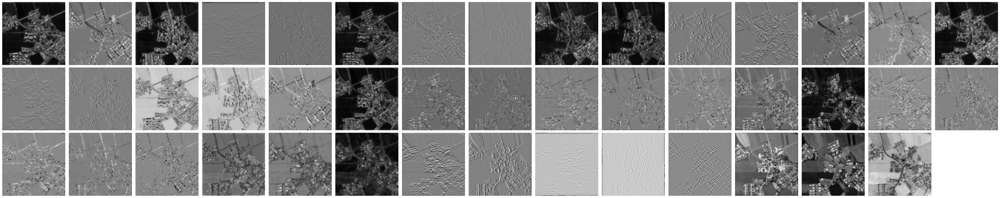

In [7]:
D = S_mubf.shape[-1]

N = 15  # Number of columns for plotting
plt.figure(figsize=(N * 3, (D // N + 1) * 3))
for i in range(D):
    plt.subplot(D // N + 1, N, i + 1)
    plt.imshow(S_mubf[:,:,i], cmap='gray')
    plt.axis('off')
plt.tight_layout()

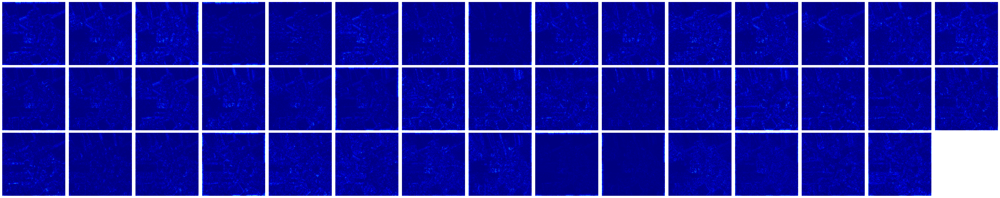

In [8]:
D = S_mubf.shape[-1]

N = 15  # Number of columns for plotting
plt.figure(figsize=(N * 3, (D // N + 1) * 3))
for i in range(D):
    plt.subplot(D // N + 1, N, i + 1)
    plt.imshow(np.abs(S_mubf[:,:,i] - S[:,:,i]), cmap='jet')
    plt.axis('off')
plt.tight_layout()

In [9]:
S_diff = np.abs(S_mubf - S)
S_diff.mean(), S_diff.std(), S_diff.max(), S_diff.min()

(np.float32(0.20162563),
 np.float32(0.5149505),
 np.float32(25.21732),
 np.float32(0.0))

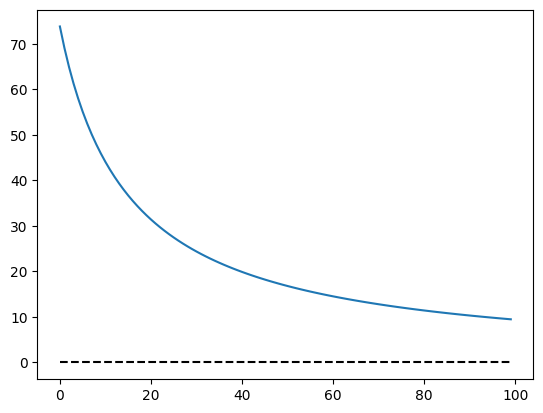

In [10]:
plt.plot(errors)
plt.plot(np.arange(len(errors)), np.zeros_like(errors), 'k--')

### Despeckle

In [11]:
params_despeckling = {
    "sar": input_sar[..., None],  # (H, W, 1)
    "descriptor": S_mubf,
    "sigma_distance": 5,
    "radius_despeckling": 50,
    "n_blocks": 20
}

sar_filtered = despeckle(**params_despeckling)

Despeckling: 100%|██████████| 400/400 [00:17<00:00, 22.59block/s]


In [12]:
params = params_texture_descriptor | params_mubf | params_despeckling
filtered_keys = ['img', 'target', 'guides', 'n_blocks', 'sar', 'descriptor']
for key in filtered_keys:
    params.pop(key)

params_filtered = params
name = 'tbog_village'
for key, value in params_filtered.items():
    if isinstance(value, list):
        value = '+'.join([str(v) for v in value])
    name += f"_{key}={value}"

name

'tbog_village_radius=7_sigma_spatial=5_sigma_guides=0.001+0.01_gamma_guides=1.0+1.0_alpha=5_n_iterations=100_sigma_distance=5_radius_despeckling=50'

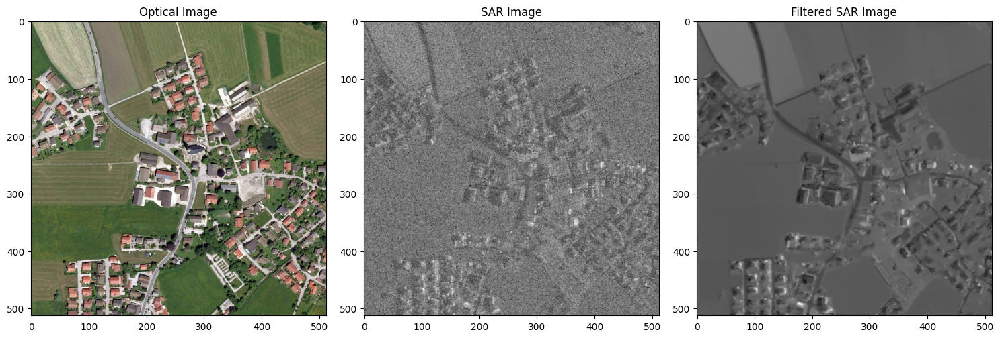

In [13]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(eo)
plt.title('Optical Image')
plt.subplot(1, 3, 2)
plt.imshow(T(sar), cmap='gray')
plt.title('SAR Image')
plt.subplot(1, 3, 3)
plt.imshow(sar_filtered, cmap='gray')
plt.title('Filtered SAR Image')
plt.tight_layout()
# plt.savefig(f'/home/nus/Downloads/{name}.png', dpi=300)

In [16]:
output_path = Path().home() / 'workspace/despeckling/despeckling/methods/tbog/results/output_village.mat'

save_image(str(output_path), sar_filtered, key=KEY_OUTPUT_SAR)

### Compute Descriptor Variance

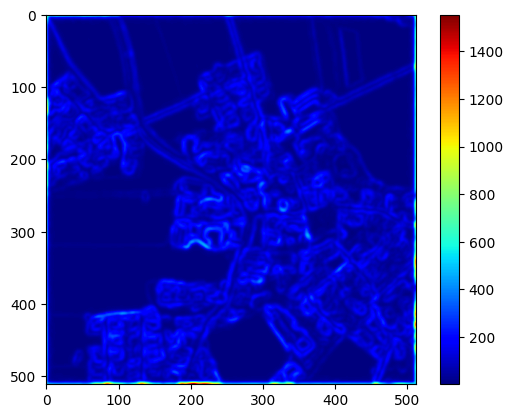

In [15]:
kernel = gaussian_kernel_1d(params_texture_descriptor['radius'])
V = compute_descriptor_variance(S_mubf, kernel)

plt.imshow(V, cmap='jet')
plt.colorbar()